<a href="https://colab.research.google.com/github/Abhijeet-sah/Cognifyz-Technologies-Internship-Level1-Task3/blob/main/Level1_Task3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🍽️ Geospatial Analysis

**Project Overview:**  
This project analyzes restaurant data using location (latitude & longitude), city, country, and rating. It visualizes restaurant distributions, explores correlations with ratings, and identifies hotspots for deeper insights.

**Author:** Abhijeet Sah  
**GitHub:** [https://github.com/Abhijeet-sah](https://github.com/Abhijeet-sah)

## 📌 Table of Contents
1. [Load Dataset](#load-dataset)
2. [Visualize Restaurant Locations on Map](#Visualize-Restaurant-Locations-on-Map)
3. [Heatmap of Restaurant Density](#Heatmap-of-Restaurant-Density)
4. [Distribution of Restaurants by City & Country](#Distribution-of-Restaurants-by-City-&-Country)
5. [Correlation Between Location & Rating](#Correlation-Between-Location-&-Rating)
6. [Extra Insights]
   - [Top-Rated Restaurants per City](#Top-Rated-Restaurants-per-City)
   - [Rating Distribution per Country](#rating-distribution-per-country)
   - [Hotspot Detection with Clustering](#hotspot-detection-with-Clustering)

Importing Libraries

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap

Load Dataset

In [6]:
df = pd.read_csv("/content/Dataset .csv")
print("Dataset shape:", df.shape)
df.head()

Dataset shape: (9551, 21)


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Visualize Restaurant Locations on Map

In [7]:
# Center map around average coordinates
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=3)

# Add markers
for _, row in df.iterrows():
    if not np.isnan(row['Latitude']) and not np.isnan(row['Longitude']):
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=2,
            popup=f"{row['City']} | Rating: {row['Aggregate rating']}",
            color="blue",
            fill=True,
            fill_color="blue"
        ).add_to(restaurant_map)

restaurant_map

Heatmap of Restaurant Density

In [8]:
heatmap_map = folium.Map(location=map_center, zoom_start=3)
heat_data = df[['Latitude', 'Longitude']].dropna().values.tolist()

HeatMap(heat_data, radius=8).add_to(heatmap_map)
heatmap_map

Distribution of Restaurants by City & Country

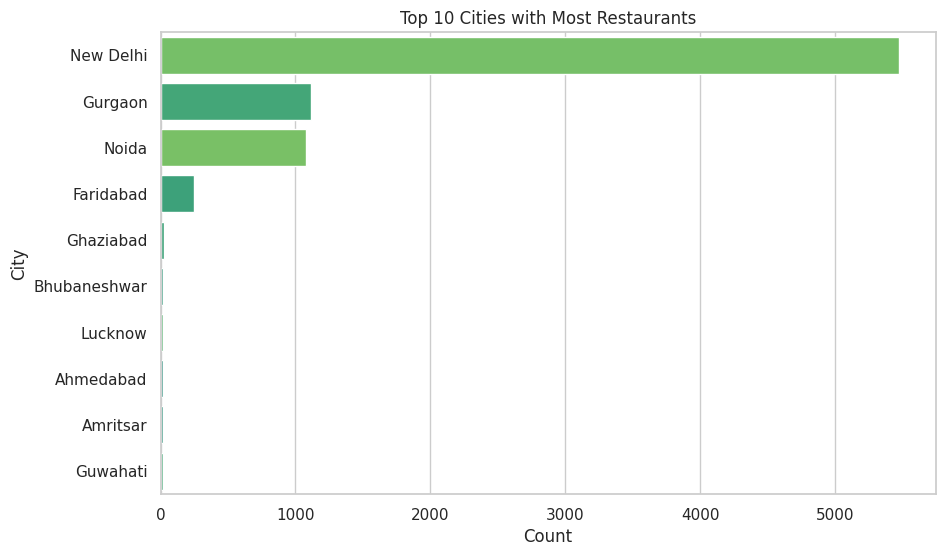

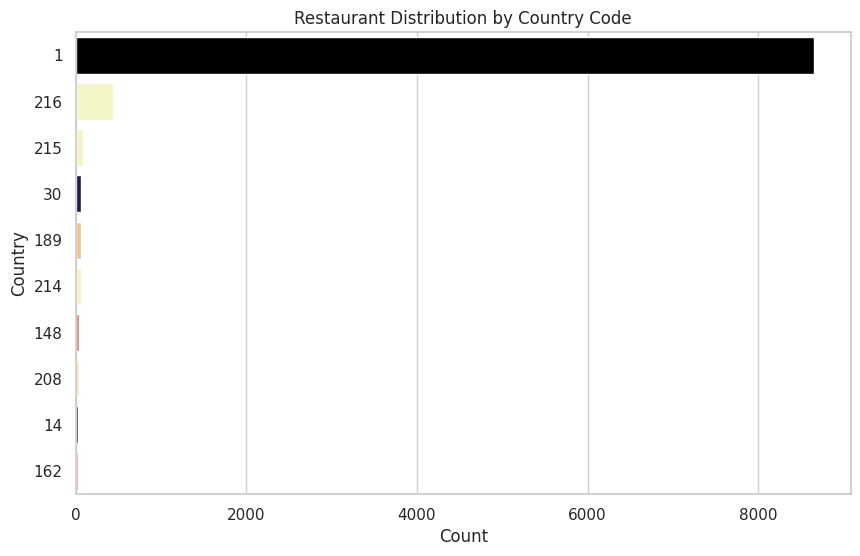

In [9]:
# Top 10 Cities
plt.figure(figsize=(10,6))
sns.countplot(
    data=df,
    y='City',
    order=df['City'].value_counts().head(10).index,
    hue='City',
    dodge=False,
    legend=False,
    palette="viridis"
)
plt.title("Top 10 Cities with Most Restaurants")
plt.xlabel("Count")
plt.ylabel("City")
plt.show()

# Country Distribution
plt.figure(figsize=(10,6))
sns.countplot(
    data=df,
    y='Country Code',
    order=df['Country Code'].value_counts().head(10).index,
    hue='Country Code',
    dodge=False,
    legend=False,
    palette="magma"
)
plt.title("Restaurant Distribution by Country Code")
plt.xlabel("Count")
plt.ylabel("Country")
plt.show()

Correlation Between Location & Rating

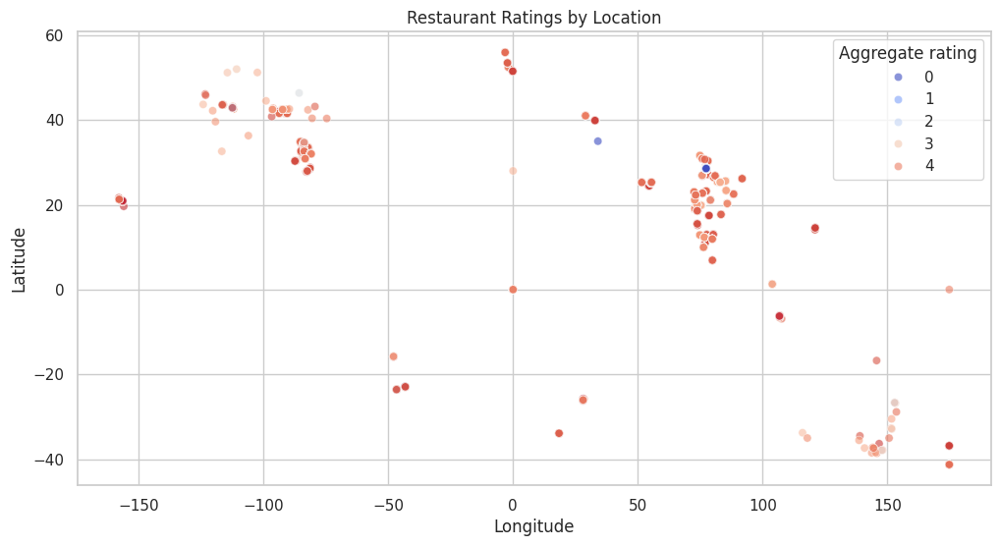

                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


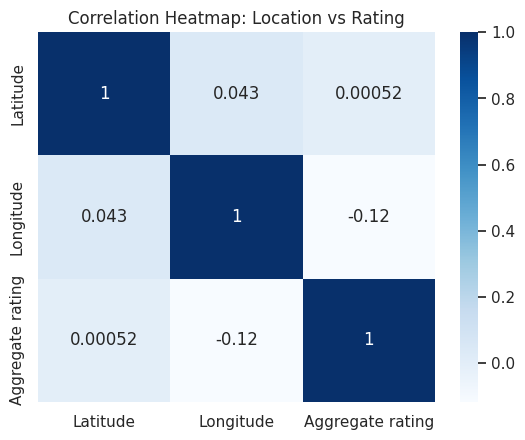

In [10]:
# Scatterplot of ratings by location
plt.figure(figsize=(12,6))
sns.scatterplot(
    data=df,
    x="Longitude", y="Latitude",
    hue="Aggregate rating",
    palette="coolwarm",
    alpha=0.6
)
plt.title("Restaurant Ratings by Location")
plt.show()

# Correlation heatmap
corr_data = df[['Latitude','Longitude','Aggregate rating']].corr()
print(corr_data)

sns.heatmap(corr_data, annot=True, cmap="Blues")
plt.title("Correlation Heatmap: Location vs Rating")
plt.show()

Top-Rated Restaurants per City

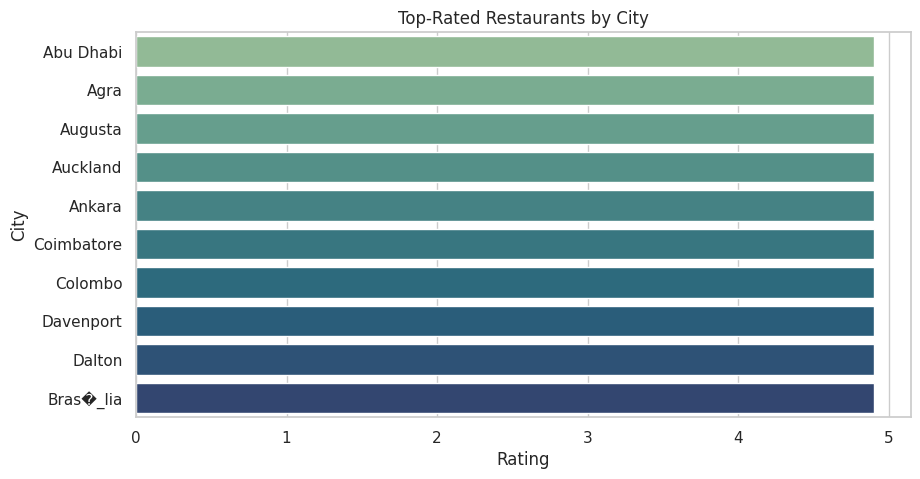

In [16]:
# Drop rows with missing values in essential columns
df_clean = df.dropna(subset=['City', 'Aggregate rating', 'Restaurant Name'])

# Find the index of the top-rated restaurant in each city
top_indices = df_clean.groupby('City')['Aggregate rating'].idxmax()

# Select the top-rated restaurants
top_per_city = df_clean.loc[top_indices, ['City', 'Restaurant Name', 'Aggregate rating']]

# Display top 10 cities by restaurant rating
top_per_city_sorted = top_per_city.sort_values('Aggregate rating', ascending=False).head(10)
top_per_city_sorted
# Plot top 10 by rating
plt.figure(figsize=(10,5))
sns.barplot(
    x='Aggregate rating',
    y='City',
    data=top_per_city_sorted,
    hue='City', # Added hue
    legend=False, # Added legend=False
    palette="crest"
)
plt.title("Top-Rated Restaurants by City")
plt.xlabel("Rating")
plt.ylabel("City")
plt.show()

Rating Distribution per Country

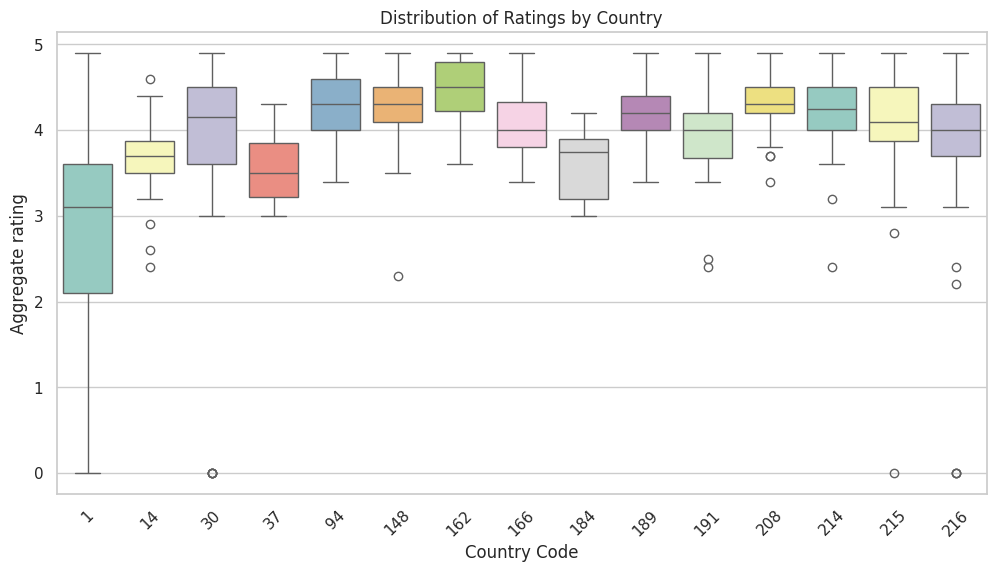

In [20]:
plt.figure(figsize=(12,6))
sns.boxplot(x='Country Code', y='Aggregate rating', data=df, hue='Country Code', legend=False, palette="Set3")
plt.xticks(rotation=45)
plt.title("Distribution of Ratings by Country")
plt.show()

Hotspot Detection with Clustering

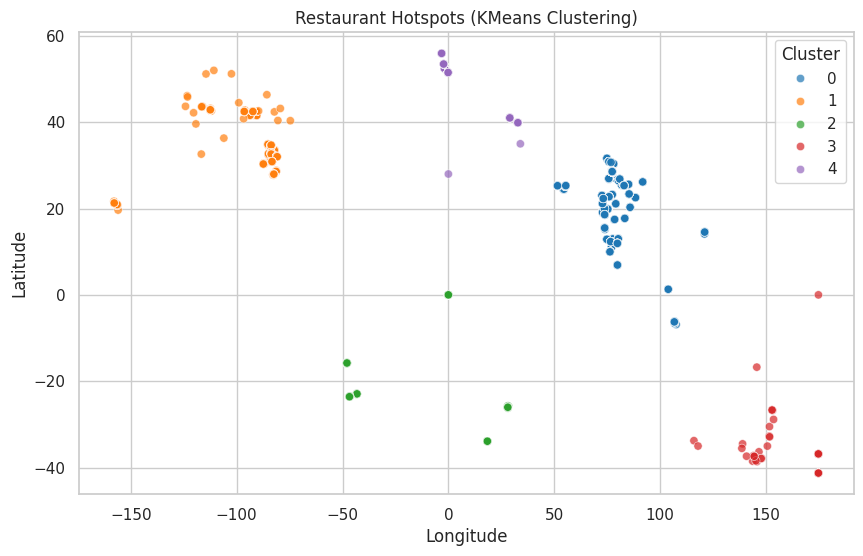

In [21]:
from sklearn.cluster import KMeans
import numpy as np

# Use only lat/long for clustering
coords = df[['Latitude', 'Longitude']].dropna()

# Choose number of clusters (try 5)
kmeans = KMeans(n_clusters=5, random_state=42)
df['Cluster'] = kmeans.fit_predict(coords)

plt.figure(figsize=(10,6))
sns.scatterplot(
    x='Longitude', y='Latitude', hue='Cluster',
    data=df, palette="tab10", alpha=0.7
)
plt.title("Restaurant Hotspots (KMeans Clustering)")
plt.show()